**<center><h1>lstm seq2seq</h1></center>**

## **Install libraries**

In [1]:
! pip install plotly
! pip install talib-binary
! pip install keras_tuner
! pip install shapash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 6.7 MB/s eta 0:00:00a 0:00:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.8/917.8 kB 3.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 kB 23.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.7/219.7 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 31.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 38.2 MB/s eta 0:00:0000:0100:01
  Created wheel for dash-renderer: filename=dash_renderer-1.8.3-py3-none-any.whl size=1013944 sha256=42047c9147c163de6976b2f3db92b25cb41058f6286b30472d7e942ac24dddc5
  Stored in directory: /root/.cache/pip/wheels/71/17/b0/8bebc086e55a01cf4036902b6ca05fce3fb4c7fd48dbd07717
  Created wheel for dash-daq: filename=dash_daq-0.5.0-p

## **Import Libraries**

In [2]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
from numpy import array
import matplotlib.pyplot as plt
import matplotlib. dates as mandates

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import talib
from talib.abstract import *

from sklearn import metrics
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
from sklearn. preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from math import sqrt

%matplotlib inline

In [3]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

## **Data Preparation**

In [4]:
# read csv file
dataset_30Minutes = pd.read_csv("/kaggle/input/eurusd/dataset_per_30minutes.csv")

In [5]:
def prepare_data(dataset):
    """
    prepare_data removes converts variables to float and removes unused variables
    
    :param dataset : dataset
    :return : converted dataset
    """
    dataset['full_date'] = dataset['date_o'].astype('str') + ' ' + dataset['time_o'].astype('str')
    dataset['Date'] = pd.to_datetime(dataset['full_date'], format="%Y-%m-%d %H:%M:%S")
    dataset.drop(['date_o', 'time_o', 'full_date'], axis=1, inplace=True)
    dataset.drop_duplicates(keep=False, inplace=True)
    dataset.sort_values(by='Date', inplace=True)
    dataset.set_index(dataset['Date'], inplace=True)
    #dataset.drop(columns=['Unnamed: 0', 'tick_volume', 'spread', 'real_volume', 'Date'], inplace=True)
    dataset.drop(columns=['Unnamed: 0', 'tick_volume', 'real_volume', 'spread', 'Date'], inplace=True)
    dataset['open'] = dataset['open'].astype(float)
    dataset['high'] = dataset['high'].astype(float)
    dataset['low'] = dataset['low'].astype(float)
    dataset['close'] = dataset['close'].astype(float)
    
    return dataset

In [6]:
dataset_per_30Minutes = prepare_data(dataset_30Minutes)

In [7]:
dataset_per_30Minutes.head()

,open,high,low,close
Date,,,,
2020-12-31 23:00:00,1.22156,1.22156,1.22155,1.22155
2021-01-04 00:00:00,1.22395,1.22396,1.22280,1.22372
2021-01-04 00:30:00,1.22365,1.22398,1.22327,1.22341
2021-01-04 01:00:00,1.22336,1.22424,1.22304,1.22399
2021-01-04 01:30:00,1.22397,1.22528,1.22395,1.22501


In [8]:
dataset_per_30Minutes.describe()

,open,high,low,close
count,22062.000000,22062.000000,22062.000000,22062.000000
mean,1.130297,1.130802,1.129783,1.130289
std,0.071751,0.071630,0.071868,0.071755
min,0.953920,0.955440,0.953570,0.953910
25%,1.072805,1.073350,1.072230,1.072802
50%,1.143450,1.143975,1.142905,1.143415
75%,1.188308,1.188757,1.187870,1.188308
max,1.234690,1.234940,1.233590,1.234690


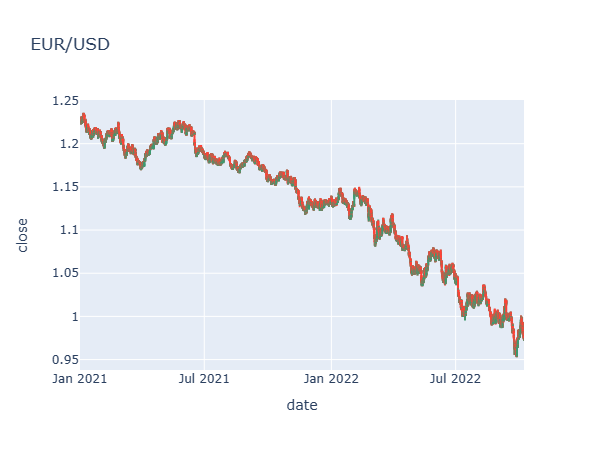

In [9]:
fig = go.Figure(data=[go.Candlestick(x=dataset_per_30Minutes.index,
                open=dataset_per_30Minutes['open'],
                high=dataset_per_30Minutes['high'],
                low=dataset_per_30Minutes['low'],
                close=dataset_per_30Minutes['close'])],
                layout = {"xaxis": {"title": "date"}, "yaxis": {"title": "close"}, "title": "EUR/USD"}
                )

# hide weekends
fig.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"])
    ]
)

# remove Rangeslider
fig.update_layout(xaxis_rangeslider_visible=False)

fig.show()

In [12]:
! pwd

/kaggle/working


In [14]:
fig.write_html("/kaggle/working/pl.html",
                full_html=False,
                include_plotlyjs='cdn')

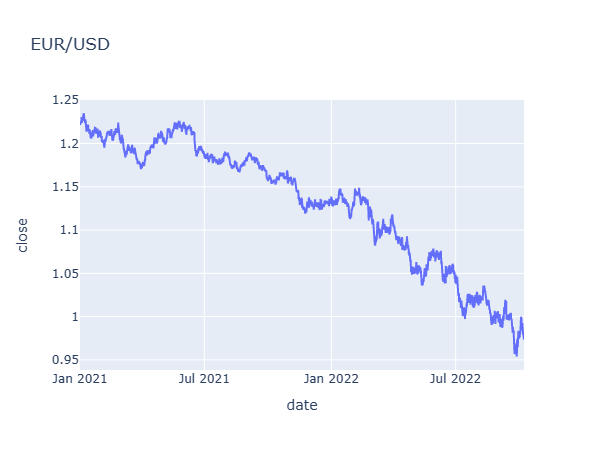

In [133]:
f1 = go.Figure(
    data = [
        go.Scatter(x=dataset_per_30Minutes.index, y=dataset_per_30Minutes['close'], name="dataset"),
    ],
    layout = {"xaxis": {"title": "date"}, "yaxis": {"title": "close"}, "title": "EUR/USD"}
)
# hide weekends
f1.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"])
    ]
)
f1

In [28]:
def get_technical_indicators(dataset):
    """
    add technical indicators as variables
    
    :param dataset : original dataset
    :return : original dataset with technical indicators 
    """
    # create 20, 30 and 200 Moving Average
    dataset['3_SMA'] = dataset['close'].rolling(window = 3).mean()
    dataset['7_SMA'] = dataset['close'].rolling(window = 7).mean()
    dataset['13_SMA'] = dataset['close'].rolling(window = 13).mean()
    
    # create ADX
    dataset['ADX_'] = talib.ADX(dataset['high'], dataset['low'], dataset['close'], timeperiod=14)
    
    # create WILLR
    dataset['WILLR_'] = talib.WILLR(dataset['high'], dataset['low'], dataset['close'], timeperiod=14)
    
    # create CCI
    dataset['CCI_'] = talib.CCI(dataset['high'], dataset['low'], dataset['close'], timeperiod=14)
    
    # create RSI
    dataset['RSI_'] = talib.RSI(dataset['close'], timeperiod=14)
    
    # create ATR
    dataset['ATR_'] = talib.ATR(dataset['high'], dataset['low'], dataset['close'], timeperiod=14)
    
    # create macd
    dataset['macd'], dataset['macdsignal'], dataset['macdhist'] = talib.MACD(dataset['close'], fastperiod=12, slowperiod=26, signalperiod=9)
    
    # create Bollinger Bands
    dataset['20sd'] = dataset['close'].rolling(window = 20).std()
    dataset['upper_band'] = dataset['3_SMA'] + (dataset['20sd']*2)
    dataset['lower_band'] = dataset['3_SMA'] - (dataset['20sd']*2)
    
    # Create Exponential moving average
    dataset['ema'] = dataset['close'].ewm(com=0.5).mean()
    
    # Create Momentum
    #dataset['momentum'] = dataset['close']-1
    #dataset['log_momentum'] = np.log(dataset['momentum'])
    
    return dataset

In [29]:
dataset_30mins = get_technical_indicators(dataset_per_30Minutes)

In [30]:
dataset_30mins.head()

,open,high,low,close,3_SMA,7_SMA,13_SMA,ADX_,WILLR_,CCI_,RSI_,ATR_,macd,macdsignal,macdhist,20sd,upper_band,lower_band,ema
Date,,,,,,,,,,,,,,,,,,,
2020-12-31 23:00:00,1.22156,1.22156,1.22155,1.22155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.221550
2021-01-04 00:00:00,1.22395,1.22396,1.22280,1.22372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.223177
2021-01-04 00:30:00,1.22365,1.22398,1.22327,1.22341,1.222893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.223338
2021-01-04 01:00:00,1.22336,1.22424,1.22304,1.22399,1.223707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.223778
2021-01-04 01:30:00,1.22397,1.22528,1.22395,1.22501,1.224137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.224603


In [31]:
dataset_30mins = dataset_30mins.dropna()

In [32]:
dataset_30mins.head()

,open,high,low,close,3_SMA,7_SMA,13_SMA,ADX_,WILLR_,CCI_,RSI_,ATR_,macd,macdsignal,macdhist,20sd,upper_band,lower_band,ema
Date,,,,,,,,,,,,,,,,,,,
2021-01-04 16:00:00,1.22990,1.23098,1.22936,1.23065,1.229800,1.229811,1.229329,65.498481,-6.191370,101.132776,71.128138,0.001225,0.001541,0.001459,0.000082,0.002095,1.233989,1.225611,1.230328
2021-01-04 16:30:00,1.23065,1.23079,1.22836,1.22892,1.229817,1.229696,1.229458,62.776648,-43.006263,12.608008,59.045651,0.001311,0.001417,0.001451,-0.000034,0.001974,1.233765,1.225869,1.229389
2021-01-04 17:00:00,1.22892,1.22908,1.22712,1.22712,1.228897,1.229383,1.229382,58.682849,-100.000000,-219.327894,49.604096,0.001357,0.001161,0.001393,-0.000232,0.001793,1.232482,1.225311,1.227876
2021-01-04 17:30:00,1.22712,1.22737,1.22605,1.22719,1.227743,1.228993,1.229212,55.139829,-76.876268,-267.572097,49.939341,0.001355,0.000952,0.001304,-0.000353,0.001691,1.231125,1.224361,1.227419
2021-01-04 18:00:00,1.22715,1.22775,1.22666,1.22674,1.227017,1.228481,1.229013,51.459524,-86.004057,-170.649432,47.740697,0.001336,0.000742,0.001192,-0.000450,0.001489,1.229994,1.224039,1.226966


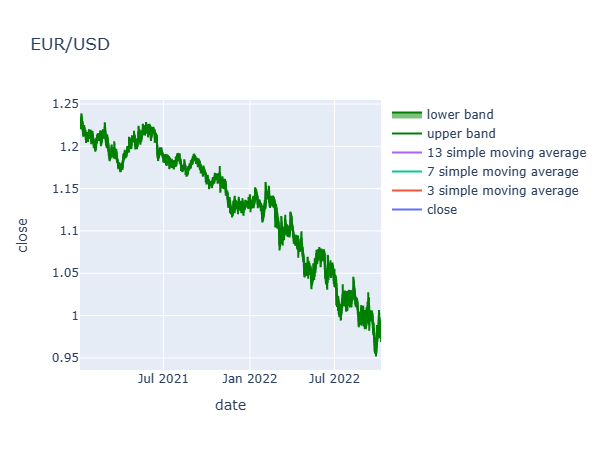

In [33]:
f1 = go.Figure(
    data = [
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['close'], name="close"),
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['3_SMA'], name="3 simple moving average"),
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['7_SMA'], name="7 simple moving average"),
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['13_SMA'], name="13 simple moving average"),
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['upper_band'], name="upper band", fill=None, mode='lines', line_color='green',),
        go.Scatter(x=dataset_30mins.index, y=dataset_30mins['lower_band'], name="lower band", fill='tonexty', mode='lines', line_color='green'),
    ],
    layout = {"xaxis": {"title": "date"}, "yaxis": {"title": "close"}, "title": "EUR/USD"}
)

# hide weekends
f1.update_xaxes(
    rangebreaks=[
        dict(bounds=["sat", "mon"])
    ]
)

f1

In [34]:
"""columns = ['open', 'low', 'high']
dataset_30mins.drop(columns, inplace=True, axis=1)"""

"columns = ['open', 'low', 'high']\ndataset_30mins.drop(columns, inplace=True, axis=1)"

## **Modeling**

First let's create the functions that we are going to use to display loss curves and the prediction curve.

In [35]:
def loss_plots(model_history):
    """
    display both of mae and mse loss curves
    
    :param dataset : model's history
    :return : a figure containing the curves of both mae and mse losses
    """
    nb_epcohs = list(range(1, len(model_history.history['loss'])+1))
    
    fig = make_subplots(rows=1, cols=2, subplot_titles=("mse loss", "mae loss"))
    
    # Add traces
    fig.add_trace(go.Scatter(x=nb_epcohs, y=model_history.history["mse"], name='train mse'), row=1, col=1)
    fig.add_trace(go.Scatter(x=nb_epcohs, y=model_history.history["val_mse"], name='val mse'), row=1, col=1)
    fig.add_trace(go.Scatter(x=nb_epcohs, y=model_history.history["mae"], name='train mae'), row=1, col=2)
    fig.add_trace(go.Scatter(x=nb_epcohs, y=model_history.history["val_mae"], name='val mae'), row=1, col=2)
    
    # Update xaxis properties
    fig.update_xaxes(title_text="epcohs", row=1, col=1)
    fig.update_xaxes(title_text="epcohs", row=1, col=2)
    
    # Update yaxis properties
    fig.update_yaxes(title_text="mse loss", row=1, col=1)
    fig.update_yaxes(title_text="mae loss", row=1, col=2)
    
    # Update title and height
    fig.update_layout(title_text="loss curves", height=500)
    
    fig.show()

In [36]:
def trueVal_vs_predictedVal(true_val, prediction_val):
    """
    display both of true price and prediction price curves
    
    :param : true value and predicted value
    :return : a figure containing the curves of both mae and mse losses
    """
    fig = go.Figure(layout = {"xaxis": {"title": "time"}, "yaxis": {"title": "close"}, "title": "EURUSD price : Prediction vs Truth"})
    fig.add_trace(go.Scatter(y=prediction_val,
                             mode='lines',
                             name='predictions'))
    fig.add_trace(go.Scatter(y=true_val,
                             mode='lines',
                             name='test'))
    fig.show()

In [37]:
def timeseries_evaluation_metrics_func(y_true, y_pred):
    def mean_absolute_percentage_error(y_true, y_pred): 
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')

### **1. Using One Feature**

In [38]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, ccf
import keras_tuner as kt
import tensorflow as tf
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Bidirectional, Activation
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Conv1D, MaxPooling1D, Flatten, ConvLSTM2D, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [39]:
dataset_30mins.columns

Index(['open', 'high', 'low', 'close', '3_SMA', '7_SMA', '13_SMA', 'ADX_',
       'WILLR_', 'CCI_', 'RSI_', 'ATR_', 'macd', 'macdsignal', 'macdhist',
       '20sd', 'upper_band', 'lower_band', 'ema'],
      dtype='object')

In [40]:
# select only one feature
data = dataset_30mins['close']

In [41]:
data.head()

Date
2021-01-04 16:00:00    1.23065
2021-01-04 16:30:00    1.22892
2021-01-04 17:00:00    1.22712
2021-01-04 17:30:00    1.22719
2021-01-04 18:00:00    1.22674
Name: close, dtype: float64

In [42]:
data.describe()

count    22029.000000
mean         1.130145
std          0.071712
min          0.953910
25%          1.072690
50%          1.143160
75%          1.188140
max          1.234690
Name: close, dtype: float64

In [43]:
# split the data into train and test sets
df_train, df_valid, df_test = data[0:16000], data[16000:20000], data[20000:] 

In [44]:
# scaling the training data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_train_data = scaler.fit_transform(df_train.values.reshape(-1,1))
scaled_train_data.shape

(16000, 1)

In [45]:
# scaling the validation data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_valid_data = scaler.fit_transform(df_valid.values.reshape(-1,1))
scaled_valid_data.shape

(4000, 1)

In [46]:
# scaling the testing data
scaler = MinMaxScaler(feature_range=(0,1))
scaled_test_data = scaler.fit_transform(df_test.values.reshape(-1,1))
scaled_test_data.shape

(2029, 1)

In [47]:
# split a univariate sequence into samples
def split_sequence(data, days_past, days_future):
    X, y = list(), list()
    
    for i in range(len(data)):        
        # find the end of this pattern
        end_ix = i + days_past
        out_end_ix = end_ix + days_future
        
        # check if we are beyond the sequence
        if out_end_ix > len(data):
            break
            
        # gather input and output parts of the pattern
        seq_x, seq_y = data[i:end_ix], data[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
        
    return np.array(X), np.array(y)

In [48]:
half_hours_past = 30   # use past 30 time steps to predict
half_hours_future = 5  # predict 5 time steps in the future

x_train, y_train = split_sequence(scaled_train_data, half_hours_past, half_hours_future)
x_valid, y_valid = split_sequence(scaled_valid_data, half_hours_past, half_hours_future)
x_test, y_test = split_sequence(scaled_test_data, half_hours_past, half_hours_future)

In [49]:
print(x_train.shape)
print(x_valid.shape)
print(x_test.shape)

(15966, 30, 1)
(3966, 30, 1)
(1995, 30, 1)


In [50]:
x_train = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))
y_train = y_train.reshape((y_train.shape[0], y_train.shape[1], 1))

x_valid = x_valid.reshape((x_valid.shape[0], x_valid.shape[1], 1))
y_valid = y_valid.reshape((y_valid.shape[0], y_valid.shape[1], 1))

x_test = x_test.reshape((x_test.shape[0], x_test.shape[1], 1))
y_test = y_test.reshape((y_test.shape[0], y_test.shape[1], 1))

In [51]:
print(x_train.shape)
print(x_valid.shape)
print(x_test.shape)

(15966, 30, 1)
(3966, 30, 1)
(1995, 30, 1)


In [52]:
def encoder_decoder_model():
    
    # Use Keras sequential model
    model = Sequential()
    
    # Encoder LSTM layer with Dropout regularisation; Set return_sequences to False since we are feeding last output to decoder layer
    model.add(LSTM(100, activation='relu',input_shape = (half_hours_past,1)))
    model.add(Dropout(0.2))
    
    # The fixed-length output of the encoder is repeated, once for each required time step in the output sequence with the RepeatVector wrapper
    model.add(RepeatVector(half_hours_future))
    
    # Decoder LSTM layer with Dropout regularisation; Set return_sequences to True to feed each output time step to a Dense layer
    model.add(LSTM(100, activation='relu', return_sequences=True))
    model.add(Dropout(0.2))
    
    # Same dense layer is repeated for each output timestep with the TimeDistributed wrapper
    model.add(TimeDistributed(Dense(units=1, activation = "linear")))
    
    return model

In [53]:
model = encoder_decoder_model()
model.summary()

2023-02-03 16:02:10.269048: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100)               40800     
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
repeat_vector (RepeatVector) (None, 5, 100)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 5, 100)            80400     
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 100)            0         
_________________________________________________________________
time_distributed (TimeDistri (None, 5, 1)              101       
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
__________________________________________________

In [54]:
model.compile(optimizer='adam', loss= 'mse', metrics=['mse', 'mae'])

In [55]:
#checkpointer = ModelCheckpoint(filepath = './checkpoint.hdf5', verbose = 0, save_best_only = True)
his=model.fit(x_train,y_train, validation_data = (x_valid, y_valid),epochs=50,verbose=1)

Epoch 1/50


2023-02-03 16:02:10.892722: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


499/499 [==============================] - 18s 29ms/step - loss: 0.0183 - mse: 0.0183 - mae: 0.0774 - val_loss: 9.7381e-04 - val_mse: 9.7381e-04 - val_mae: 0.0237
Epoch 2/50
499/499 [==============================] - 15s 30ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0383 - val_loss: 0.0012 - val_mse: 0.0012 - val_mae: 0.0264
Epoch 3/50
499/499 [==============================] - 14s 28ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0332 - val_loss: 9.2905e-04 - val_mse: 9.2905e-04 - val_mae: 0.0231
Epoch 4/50
499/499 [==============================] - 15s 29ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0303 - val_loss: 9.3347e-04 - val_mse: 9.3347e-04 - val_mae: 0.0233
Epoch 5/50
499/499 [==============================] - 13s 27ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0282 - val_loss: 7.3681e-04 - val_mse: 7.3681e-04 - val_mae: 0.0202
Epoch 6/50
499/499 [==============================] - 14s 29ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0261 - val_loss: 8.4680e-04 - val_mse: 8.46

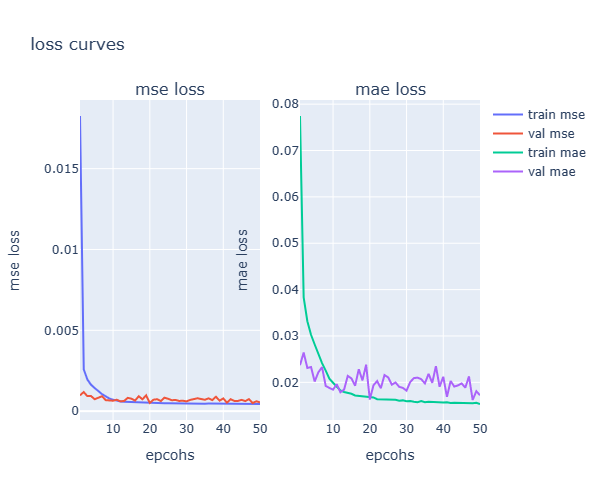

In [56]:
# display loss plots
loss_plots(his)

In [57]:
# Predicting the prices
predicted_sales = model.predict(x_test)

In [58]:
# We upse numpy squeeze to transform (samples, timesteps, number of features) into (samples, timesteps), since that is what inverse_transform expects
y_test = scaler.inverse_transform(np.squeeze(y_test))
predicted_sales = scaler.inverse_transform(np.squeeze(predicted_sales))


# We flatten the 2 dimensional array so we can plot it with matplotlib
y_test = y_test.flatten()
predicted_sales = predicted_sales.flatten()

In [59]:
timeseries_evaluation_metrics_func(y_test, predicted_sales)

Evaluation metric results:-
MSE is : 4.932549878700589e-06
MAE is : 0.0015654841063076396
RMSE is : 0.0022209344606945493
MAPE is : 0.1579777711079484
R2 is : 0.9802686227825275



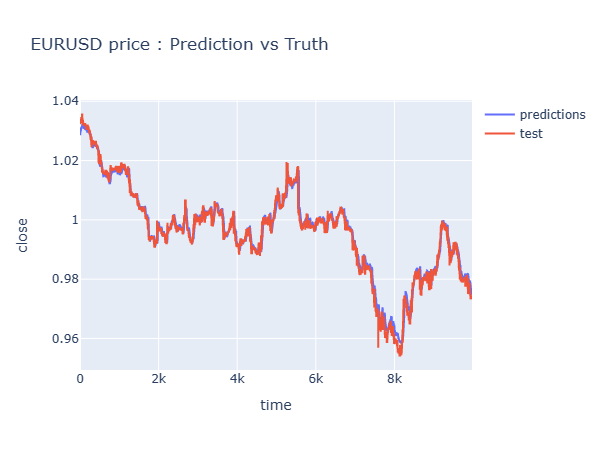

In [60]:
trueVal_vs_predictedVal(y_test, predicted_sales)

### **2. Using Multiple Features**

In [61]:
dataset_30mins.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 22029 entries, 2021-01-04 16:00:00 to 2022-10-07 23:30:00
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   open        22029 non-null  float64
 1   high        22029 non-null  float64
 2   low         22029 non-null  float64
 3   close       22029 non-null  float64
 4   3_SMA       22029 non-null  float64
 5   7_SMA       22029 non-null  float64
 6   13_SMA      22029 non-null  float64
 7   ADX_        22029 non-null  float64
 8   WILLR_      22029 non-null  float64
 9   CCI_        22029 non-null  float64
 10  RSI_        22029 non-null  float64
 11  ATR_        22029 non-null  float64
 12  macd        22029 non-null  float64
 13  macdsignal  22029 non-null  float64
 14  macdhist    22029 non-null  float64
 15  20sd        22029 non-null  float64
 16  upper_band  22029 non-null  float64
 17  lower_band  22029 non-null  float64
 18  ema         22029 non-null  flo

In [62]:
# remove features
columns = ['open', 'low', 'high']
dataset_30mins.drop(columns, inplace=True, axis=1)

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [63]:
def multivariate_data(dataset, target, start_index, end_index, history_size, target_size, step, single_step=False):
    data = []
    labels = []

    start_index = start_index + history_size
    if end_index is None:
        end_index = len(dataset) - target_size
        
    for i in range(start_index, end_index):
        indices = range(i-history_size, i, step)
        data.append(dataset[indices])
        
        if single_step:
            labels.append(target[i + target_size])
        else:
            labels.append(target[i : i + target_size])

    return np.array(data), np.array(labels)

In [64]:
train_end_idx = 13217
cv_end_idx = 17623
test_end_idx = 22029

In [65]:
X = dataset_30mins[dataset_30mins.columns.drop('close')].values
y = dataset_30mins['close'].values

y = y.reshape(-1, 1)

In [66]:
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

In [67]:
scaler_X.fit(X[:train_end_idx])
scaler_y.fit(y[:train_end_idx])

MinMaxScaler()

In [69]:
X_norm = scaler_X.transform(X)
y_norm = scaler_y.transform(y)

In [70]:
dataset_norm = np.concatenate((X_norm, y_norm), axis=1)

past_history = 18
future_target = 0

In [71]:
X_train, y_train = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                     0, train_end_idx, past_history, 
                                     future_target, step=1, single_step=True)
X_val, y_val = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                 train_end_idx, cv_end_idx, past_history, 
                                 future_target, step=1, single_step=True)
X_test, y_test = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                   cv_end_idx, test_end_idx, past_history, 
                                   future_target, step=1, single_step=True)

In [72]:
batch_size = 64
buffer_size = 1000

In [73]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train = train.cache().shuffle(buffer_size).batch(batch_size).prefetch(1)

validation = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation = validation.batch(batch_size).prefetch(1)

In [74]:
# Define some common parameters

input_shape = X_train.shape[-2:]
loss = tf.keras.losses.MeanSquaredError()
metric = [tf.keras.metrics.RootMeanSquaredError()]
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
              lambda epoch: 1e-4 * 10**(epoch / 10))
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10)

In [75]:
y_test = y_test.reshape(-1, 1)
y_test_inv = scaler_y.inverse_transform(y_test)

In [76]:
encoder_decoder = tf.keras.models.Sequential([
    LSTM(50, activation='relu', input_shape=input_shape),
    RepeatVector(past_history),
    LSTM(50, activation='relu', return_sequences=True),
    TimeDistributed(Dense(50, activation='relu')),
    Flatten(),
    Dense(25, activation='relu'),
    Dense(1)
])



model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'encoder_decoder.h5', save_best_only=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, amsgrad=True)

encoder_decoder.compile(optimizer=optimizer,
                    loss= 'mse', metrics=['mse', 'mae'])

In [77]:
history = encoder_decoder.fit(train, epochs=100,
                              validation_data=validation,
                              callbacks=[early_stopping, 
                                         model_checkpoint])

Epoch 1/100
207/207 [==============================] - 11s 38ms/step - loss: 0.0144 - mse: 0.0144 - mae: 0.0445 - val_loss: 0.0823 - val_mse: 0.0823 - val_mae: 0.2199
Epoch 2/100
207/207 [==============================] - 9s 41ms/step - loss: 9.5533e-05 - mse: 9.5533e-05 - mae: 0.0071 - val_loss: 0.0727 - val_mse: 0.0727 - val_mae: 0.2051
Epoch 3/100
207/207 [==============================] - 8s 37ms/step - loss: 6.2753e-05 - mse: 6.2753e-05 - mae: 0.0059 - val_loss: 0.0785 - val_mse: 0.0785 - val_mae: 0.2139
Epoch 4/100
207/207 [==============================] - 8s 37ms/step - loss: 5.2800e-05 - mse: 5.2800e-05 - mae: 0.0053 - val_loss: 0.0763 - val_mse: 0.0763 - val_mae: 0.2115
Epoch 5/100
207/207 [==============================] - 8s 37ms/step - loss: 5.0787e-05 - mse: 5.0787e-05 - mae: 0.0052 - val_loss: 0.0762 - val_mse: 0.0762 - val_mae: 0.2111
Epoch 6/100
207/207 [==============================] - 8s 39ms/step - loss: 4.7708e-05 - mse: 4.7708e-05 - mae: 0.0051 - val_loss: 0.0771

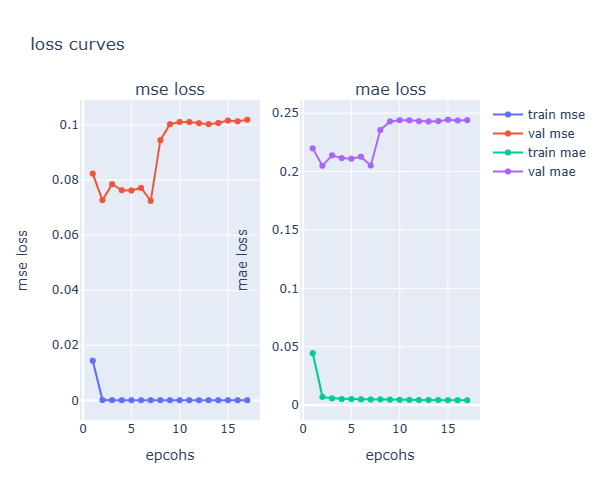

In [78]:
# display loss plots
loss_plots(history)

In [79]:
forecast = encoder_decoder.predict(X_test)
encoder_decoder_forecast = scaler_y.inverse_transform(forecast)

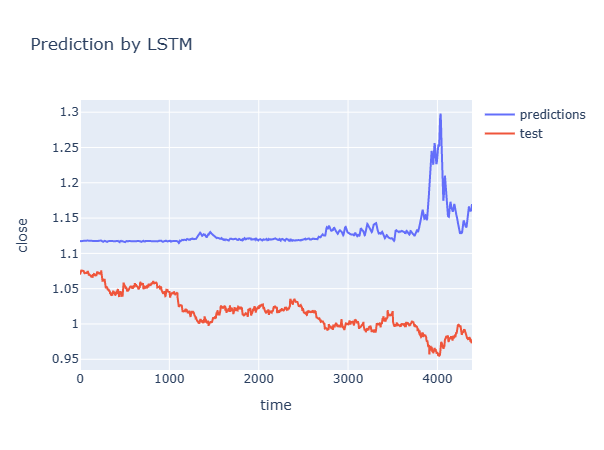

In [80]:
df_predictions = pd.DataFrame(encoder_decoder_forecast)
df_test = pd.DataFrame(y_test_inv)

fig = go.Figure(layout = {"xaxis": {"title": "time"}, "yaxis": {"title": "close"}, "title": "Prediction by LSTM"})

fig.add_trace(go.Scatter(y=df_predictions[0],
                    mode='lines',
                    name='predictions'))
fig.add_trace(go.Scatter(y=df_test[0],
                    mode='lines',
                    name='test'))

In [81]:
timeseries_evaluation_metrics_func(df_test[0], df_predictions[0])

Evaluation metric results:-
MSE is : 0.014989232461757086
MAE is : 0.11304629558291127
RMSE is : 0.12243052095681488
MAPE is : 11.237481953075813
R2 is : -19.851662558161006



### **3. Using PCA**

In [82]:
X = dataset_30mins[dataset_30mins.columns.drop('close')].values
y = dataset_30mins['close'].values

y = y.reshape(-1, 1)

In [83]:
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

In [84]:
scaler_X.fit(X[:train_end_idx])
scaler_y.fit(y[:train_end_idx])

MinMaxScaler()

In [85]:
X_norm = scaler_X.transform(X)
y_norm = scaler_y.transform(y)

In [86]:
pca = PCA()
X_pca = pca.fit(X_norm[:train_end_idx])

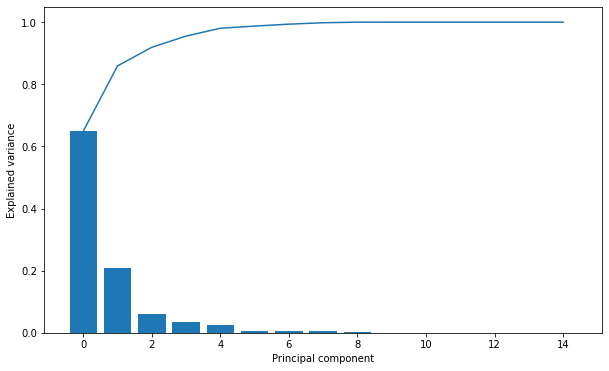

In [87]:
num_components = len(pca.explained_variance_ratio_)
plt.figure(figsize=(10, 6))
plt.bar(np.arange(num_components), pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal component')
plt.ylabel('Explained variance')
plt.show()

In [88]:
pca = PCA(n_components=0.65)
pca.fit(X_norm[:train_end_idx])
X_pca = pca.transform(X_norm)

In [89]:
X_pca.shape

(22029, 2)

In [90]:
dataset_norm = np.concatenate((X_pca, y_norm), axis=1)

past_history = 18
future_target = 0

In [91]:
X_train, y_train = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                     0, train_end_idx, past_history, 
                                     future_target, step=1, single_step=True)
X_val, y_val = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                 train_end_idx, cv_end_idx, past_history, 
                                 future_target, step=1, single_step=True)
X_test, y_test = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                   cv_end_idx, test_end_idx, past_history, 
                                   future_target, step=1, single_step=True)

In [92]:
batch_size = 64
buffer_size = 1000

In [93]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train = train.cache().shuffle(buffer_size).batch(batch_size).prefetch(1)

validation = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation = validation.batch(batch_size).prefetch(1)

In [94]:
# Define some common parameters

input_shape = X_train.shape[-2:]
loss = tf.keras.losses.MeanSquaredError()
metric = [tf.keras.metrics.RootMeanSquaredError()]
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
              lambda epoch: 1e-4 * 10**(epoch / 10))
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10)

In [95]:
y_test = y_test.reshape(-1, 1)
y_test_inv = scaler_y.inverse_transform(y_test)

In [96]:
encoder_decoder = tf.keras.models.Sequential([
    LSTM(50, activation='relu', input_shape=input_shape),
    RepeatVector(past_history),
    LSTM(50, activation='relu', return_sequences=True),
    TimeDistributed(Dense(50, activation='relu')),
    Flatten(),
    Dense(25, activation='relu'),
    Dense(1)
])



model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'encoder_decoder.h5', save_best_only=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, amsgrad=True)

encoder_decoder.compile(optimizer=optimizer,
                    loss= 'mse', metrics=['mse', 'mae'])

In [97]:
history = encoder_decoder.fit(train, epochs=100,
                              validation_data=validation,
                              callbacks=[early_stopping, 
                                         model_checkpoint])

Epoch 1/100
207/207 [==============================] - 12s 39ms/step - loss: 0.0207 - mse: 0.0207 - mae: 0.0556 - val_loss: 0.0891 - val_mse: 0.0891 - val_mae: 0.2292
Epoch 2/100
207/207 [==============================] - 7s 36ms/step - loss: 6.4522e-05 - mse: 6.4522e-05 - mae: 0.0058 - val_loss: 0.0803 - val_mse: 0.0803 - val_mae: 0.2156
Epoch 3/100
207/207 [==============================] - 7s 35ms/step - loss: 5.1676e-05 - mse: 5.1676e-05 - mae: 0.0052 - val_loss: 0.0786 - val_mse: 0.0786 - val_mae: 0.2131
Epoch 4/100
207/207 [==============================] - 8s 39ms/step - loss: 5.4334e-05 - mse: 5.4334e-05 - mae: 0.0053 - val_loss: 0.0773 - val_mse: 0.0773 - val_mae: 0.2111
Epoch 5/100
207/207 [==============================] - 8s 38ms/step - loss: 4.7092e-05 - mse: 4.7092e-05 - mae: 0.0049 - val_loss: 0.0712 - val_mse: 0.0712 - val_mae: 0.2015
Epoch 6/100
207/207 [==============================] - 7s 36ms/step - loss: 4.5449e-05 - mse: 4.5449e-05 - mae: 0.0048 - val_loss: 0.0754

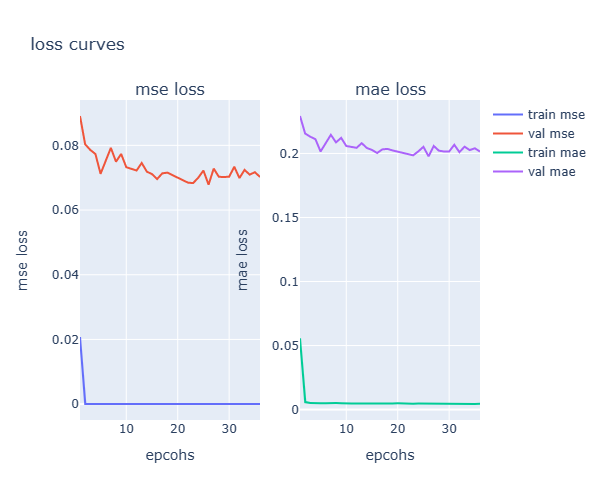

In [98]:
# display loss plots
loss_plots(history)

In [99]:
forecast = encoder_decoder.predict(X_test)
encoder_decoder_forecast = scaler_y.inverse_transform(forecast)

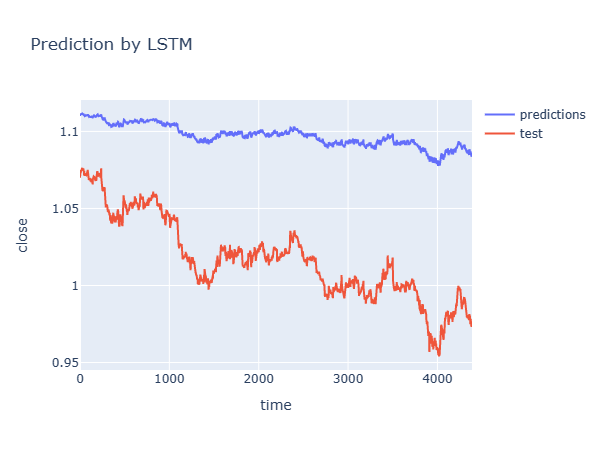

In [100]:
df_predictions = pd.DataFrame(encoder_decoder_forecast)
df_test = pd.DataFrame(y_test_inv)

fig = go.Figure(layout = {"xaxis": {"title": "time"}, "yaxis": {"title": "close"}, "title": "Prediction by LSTM"})

fig.add_trace(go.Scatter(y=df_predictions[0],
                    mode='lines',
                    name='predictions'))
fig.add_trace(go.Scatter(y=df_test[0],
                    mode='lines',
                    name='test'))

In [101]:
timeseries_evaluation_metrics_func(df_test[0], df_predictions[0])

Evaluation metric results:-
MSE is : 0.006837213939002718
MAE is : 0.08029190966602662
RMSE is : 0.0826874472879815
MAPE is : 7.952543601393865
R2 is : -8.511312754524278



### **4. Feature Selection**

For feature selection, i decided to train a RandomForestRegressor and shapash library in order to select the best features.
<br>
we used conference papers in order to make this decision.
<br>
research link:
https://www.researchgate.net/publication/346869932_LSTM_Neural_Network_Model_with_Feature_selection_for_Financial_Time_series_Prediction

In [187]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [188]:
dataset_30mins.head()

,close,3_SMA,7_SMA,13_SMA,ADX_,WILLR_,CCI_,RSI_,ATR_,macd,macdsignal,macdhist,20sd,upper_band,lower_band,ema
Date,,,,,,,,,,,,,,,,
2021-01-04 16:00:00,1.23065,1.229800,1.229811,1.229329,65.498481,-6.191370,101.132776,71.128138,0.001225,0.001541,0.001459,0.000082,0.002095,1.233989,1.225611,1.230328
2021-01-04 16:30:00,1.22892,1.229817,1.229696,1.229458,62.776648,-43.006263,12.608008,59.045651,0.001311,0.001417,0.001451,-0.000034,0.001974,1.233765,1.225869,1.229389
2021-01-04 17:00:00,1.22712,1.228897,1.229383,1.229382,58.682849,-100.000000,-219.327894,49.604096,0.001357,0.001161,0.001393,-0.000232,0.001793,1.232482,1.225311,1.227876
2021-01-04 17:30:00,1.22719,1.227743,1.228993,1.229212,55.139829,-76.876268,-267.572097,49.939341,0.001355,0.000952,0.001304,-0.000353,0.001691,1.231125,1.224361,1.227419
2021-01-04 18:00:00,1.22674,1.227017,1.228481,1.229013,51.459524,-86.004057,-170.649432,47.740697,0.001336,0.000742,0.001192,-0.000450,0.001489,1.229994,1.224039,1.226966


In [189]:
dataset_30mins.columns

Index(['close', '3_SMA', '7_SMA', '13_SMA', 'ADX_', 'WILLR_', 'CCI_', 'RSI_',
       'ATR_', 'macd', 'macdsignal', 'macdhist', '20sd', 'upper_band',
       'lower_band', 'ema'],
      dtype='object')

In [191]:
"""x = dataset_30mins.drop('close', axis=1)
y = dataset_30mins['close']"""

"x = dataset_30mins.drop('close', axis=1)\ny = dataset_30mins['close']"

In [193]:
scaler = MinMaxScaler()
dataset_30mins[['3_SMA', '7_SMA', '13_SMA', 'ADX_', 'WILLR_', 'CCI_', 'RSI_', 'ATR_', 'macd', 'macdsignal', 'macdhist', '20sd', 'upper_band', 'lower_band', 'ema']] = scaler.fit_transform(dataset_30mins[['3_SMA', '7_SMA', '13_SMA', 'ADX_', 'WILLR_', 'CCI_', 'RSI_', 'ATR_', 'macd', 'macdsignal', 'macdhist', '20sd', 'upper_band', 'lower_band', 'ema']])


scaler_y = MinMaxScaler()
dataset_30mins[["close"]] = scaler_y.fit_transform(dataset_30mins[["close"]])

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:3678: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:3678: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [194]:
dataset_30mins.head()

,close,3_SMA,7_SMA,13_SMA,ADX_,WILLR_,CCI_,RSI_,ATR_,macd,macdsignal,macdhist,20sd,upper_band,lower_band,ema
Date,,,,,,,,,,,,,,,,
2021-01-04 16:00:00,0.985612,0.983868,0.984641,0.984368,0.813623,9.380863e-01,0.610770,0.775694,0.317848,0.674669,0.693358,0.540699,0.245425,0.983004,0.981005,0.985492
2021-01-04 16:30:00,0.979450,0.983928,0.984226,0.984833,0.776597,5.699374e-01,0.515546,0.623866,0.348475,0.660328,0.692281,0.506859,0.230405,0.982207,0.981928,0.982137
2021-01-04 17:00:00,0.973039,0.980634,0.983103,0.984556,0.720909,1.110223e-16,0.266057,0.505224,0.364971,0.630544,0.684844,0.448510,0.207821,0.977649,0.979932,0.976729
2021-01-04 17:30:00,0.973289,0.976506,0.981704,0.983945,0.672712,2.312373e-01,0.214162,0.509437,0.364027,0.606323,0.673546,0.413095,0.195146,0.972827,0.976531,0.975093
2021-01-04 18:00:00,0.971686,0.973905,0.979870,0.983232,0.622648,1.399594e-01,0.318419,0.481809,0.357305,0.581918,0.659119,0.384393,0.169952,0.968807,0.975377,0.973475


In [195]:
x = dataset_30mins.drop('close', axis=1)
y = dataset_30mins['close']

In [196]:
# split the data between train and test
Xtrain, Xtest, ytrain, ytest = train_test_split(x, y, train_size=0.75, random_state=1)

In [197]:
print(Xtrain.shape)
print(ytrain.shape)
print(Xtest.shape)
print(ytest.shape)

(16521, 15)
(16521,)
(5508, 15)
(5508,)


In [198]:
# fit the model
rf = RandomForestRegressor(n_estimators=100)
rf.fit(Xtrain, ytrain)

RandomForestRegressor()

In [199]:
y_pred = rf.predict(Xtest)

In [200]:
mae = mean_absolute_error(ytest, y_pred)
mse = mean_squared_error(ytest, y_pred)
print("MAE=", mae)
print("RMSE=", np.sqrt(mse))

MAE= 0.0005129097395092493
RMSE= 0.0008194766858838497


In [203]:
from shapash import SmartExplainer
import random

In [206]:
xpl = SmartExplainer(
  model=rf,
)

In [207]:
predictions = pd.DataFrame(y_pred, index=ytest.index)
true_vals = pd.DataFrame(ytest, index=ytest.index)

In [208]:
xpl.compile(
    x=Xtest,    
    y_pred=predictions[0], # Optional: for your own prediction (by default: model.predict)
    y_target=true_vals["close"], # Optional: allows to display True Values vs Predicted Values
)

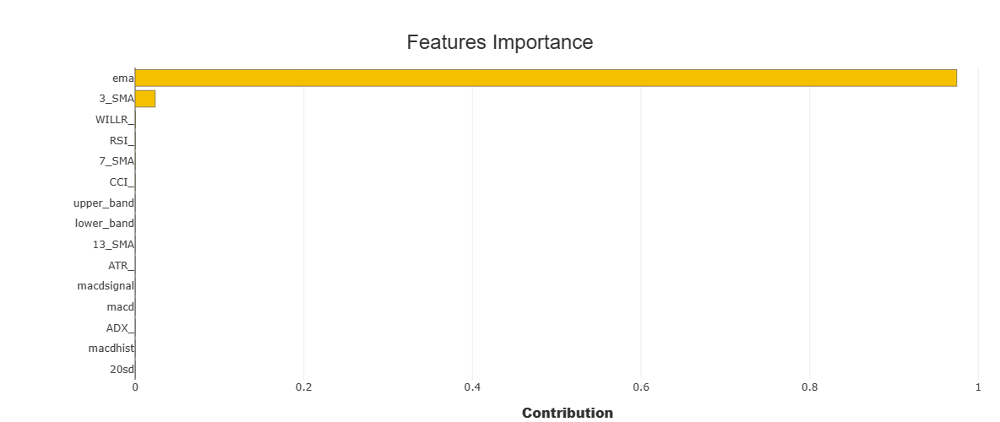

In [209]:
xpl.plot.features_importance()

so i decided to use only the "ema" variable to train the model

In [102]:
dataset_30mins.columns

Index(['close', '3_SMA', '7_SMA', '13_SMA', 'ADX_', 'WILLR_', 'CCI_', 'RSI_',
       'ATR_', 'macd', 'macdsignal', 'macdhist', '20sd', 'upper_band',
       'lower_band', 'ema'],
      dtype='object')

In [108]:
X = dataset_30mins[['ema','3_SMA']].values
y = dataset_30mins['close'].values

In [109]:
y = y.reshape(-1, 1)

In [110]:
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

In [111]:
scaler_X.fit(X[:train_end_idx])
scaler_y.fit(y[:train_end_idx])

MinMaxScaler()

In [112]:
X_norm = scaler_X.transform(X)
y_norm = scaler_y.transform(y)

In [113]:
dataset_norm = np.concatenate((X_norm, y_norm), axis=1)

past_history = 18
future_target = 0

In [114]:
X_train, y_train = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                     0, train_end_idx, past_history, 
                                     future_target, step=1, single_step=True)
X_val, y_val = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                 train_end_idx, cv_end_idx, past_history, 
                                 future_target, step=1, single_step=True)
X_test, y_test = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                   cv_end_idx, test_end_idx, past_history, 
                                   future_target, step=1, single_step=True)

In [115]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train = train.cache().shuffle(buffer_size).batch(batch_size).prefetch(1)

validation = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation = validation.batch(batch_size).prefetch(1)

In [116]:
# Define some common parameters

input_shape = X_train.shape[-2:]
loss = tf.keras.losses.MeanSquaredError()
metric = [tf.keras.metrics.RootMeanSquaredError()]
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
              lambda epoch: 1e-4 * 10**(epoch / 10))
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10)

In [117]:
y_test = y_test.reshape(-1, 1)
y_test_inv = scaler_y.inverse_transform(y_test)

In [118]:
encoder_decoder = tf.keras.models.Sequential([
    LSTM(50, activation='relu', input_shape=input_shape),
    RepeatVector(past_history),
    LSTM(50, activation='relu', return_sequences=True),
    TimeDistributed(Dense(50, activation='relu')),
    Flatten(),
    Dense(25, activation='relu'),
    Dense(1)
])



model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'encoder_decoder.h5', save_best_only=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, amsgrad=True)

encoder_decoder.compile(optimizer=optimizer,
                    loss= 'mse', metrics=['mse', 'mae'])

In [119]:
history = encoder_decoder.fit(train, epochs=100,
                              validation_data=validation,
                              callbacks=[early_stopping, 
                                         model_checkpoint])

Epoch 1/100
207/207 [==============================] - 11s 38ms/step - loss: 0.0208 - mse: 0.0208 - mae: 0.0592 - val_loss: 0.1336 - val_mse: 0.1336 - val_mae: 0.2797
Epoch 2/100
207/207 [==============================] - 7s 36ms/step - loss: 1.2985e-04 - mse: 1.2985e-04 - mae: 0.0079 - val_loss: 0.1353 - val_mse: 0.1353 - val_mae: 0.2803
Epoch 3/100
207/207 [==============================] - 8s 39ms/step - loss: 7.8364e-05 - mse: 7.8364e-05 - mae: 0.0063 - val_loss: 0.1292 - val_mse: 0.1292 - val_mae: 0.2741
Epoch 4/100
207/207 [==============================] - 8s 38ms/step - loss: 7.3919e-05 - mse: 7.3919e-05 - mae: 0.0061 - val_loss: 0.1143 - val_mse: 0.1143 - val_mae: 0.2571
Epoch 5/100
207/207 [==============================] - 7s 36ms/step - loss: 7.0323e-05 - mse: 7.0323e-05 - mae: 0.0060 - val_loss: 0.1157 - val_mse: 0.1157 - val_mae: 0.2597
Epoch 6/100
207/207 [==============================] - 7s 36ms/step - loss: 6.2921e-05 - mse: 6.2921e-05 - mae: 0.0057 - val_loss: 0.1129

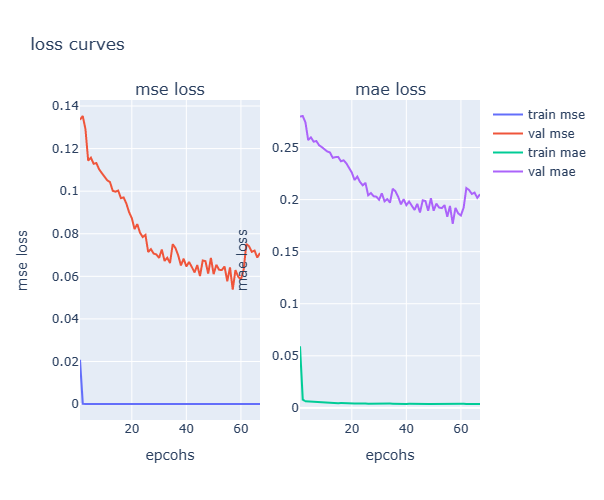

In [120]:
# display loss plots
loss_plots(history)

In [121]:
forecast = encoder_decoder.predict(X_test)
encoder_decoder_forecast = scaler_y.inverse_transform(forecast)

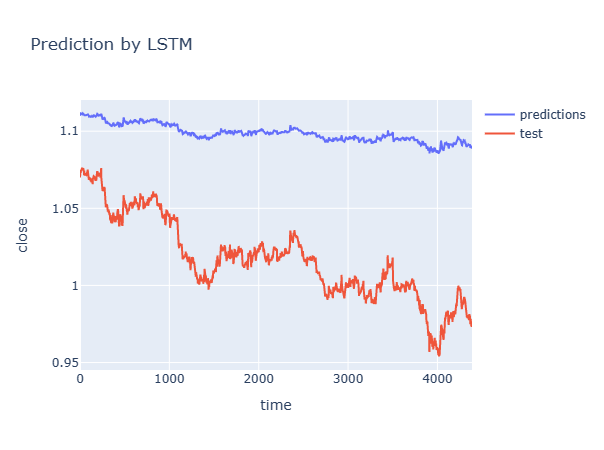

In [122]:
df_predictions = pd.DataFrame(encoder_decoder_forecast)
df_test = pd.DataFrame(y_test_inv)

fig = go.Figure(layout = {"xaxis": {"title": "time"}, "yaxis": {"title": "close"}, "title": "Prediction by LSTM"})

fig.add_trace(go.Scatter(y=df_predictions[0],
                    mode='lines',
                    name='predictions'))
fig.add_trace(go.Scatter(y=df_test[0],
                    mode='lines',
                    name='test'))

In [123]:
timeseries_evaluation_metrics_func(df_test[0], df_predictions[0])

Evaluation metric results:-
MSE is : 0.0071501622567403545
MAE is : 0.0818492358361577
RMSE is : 0.08455863206521469
MAPE is : 8.109686070680345
R2 is : -8.946658109015125



### **5. Adding New Features**

In [134]:
dataset_per_30Minutes.head()

,open,high,low,close
Date,,,,
2020-12-31 23:00:00,1.22156,1.22156,1.22155,1.22155
2021-01-04 00:00:00,1.22395,1.22396,1.22280,1.22372
2021-01-04 00:30:00,1.22365,1.22398,1.22327,1.22341
2021-01-04 01:00:00,1.22336,1.22424,1.22304,1.22399
2021-01-04 01:30:00,1.22397,1.22528,1.22395,1.22501


In [ ]:
dataset_per_30Minutes.